# HOMEWORK 3

For this homework you are going to implement the **unsharp masking** filter (USM). It is a technique to improve the sharpness of an image by combining the image with its blurred (unsharp) version. See the Wikipedia [page](https://en.wikipedia.org/wiki/Unsharp_masking) for more details.

### Unsharp Masking (USP)
The USM technique consists of the following steps:
* Load the image you will be working with.
* Create a blurred (unsharp) version of the original image.
* Add the unsharp image (with a certain **weight**) to the original.

To sum it up, the USM performs the following operation:

`sharpened = original + (original − unsharp) × amount`

Even though we provide you an image to work with, you are welcome to use your own images :-)

In [10]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [12, 10]

In [13]:
img = cv2.imread('data/mountain.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

(Text(0.5, 1.0, 'Unsharp'), <matplotlib.image.AxesImage at 0x7f93902757c0>)

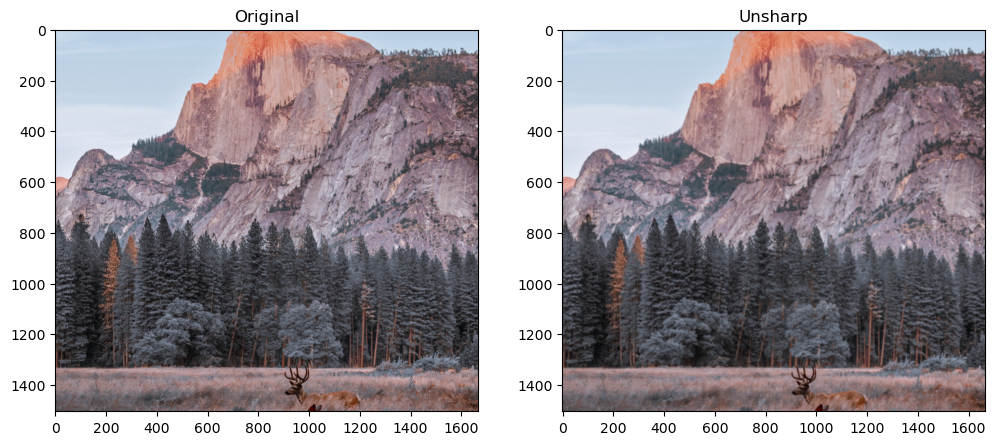

In [17]:
# Create a blurred (unsharp) version of the original image (you can use Gaussian blurring)
unsharp = cv2.GaussianBlur(img, ksize=(5,5), sigmaX=5)

plt.subplot(121).set_title('Original'), plt.imshow(img)
plt.subplot(122).set_title('Unsharp'), plt.imshow(unsharp)

In [18]:
# Create the difference image (original − unsharp)
# Note: Remember that you are working with uint8 data types. Any addition or substractions
# might result in overflow or underflow, respectively. You can prevent this by casting the images to float.
diff = img.astype(np.float32) - unsharp.astype(np.float32)


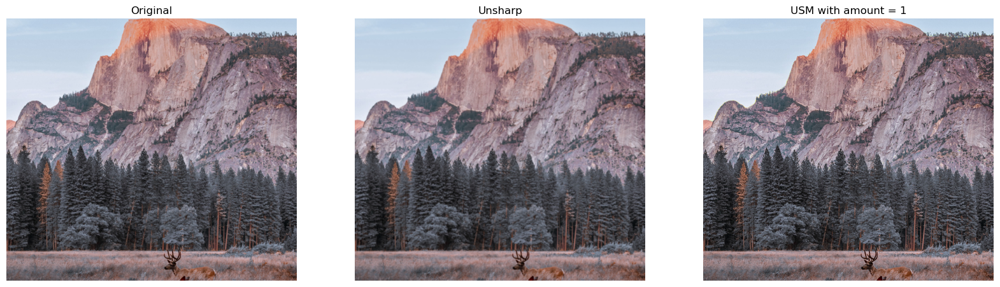

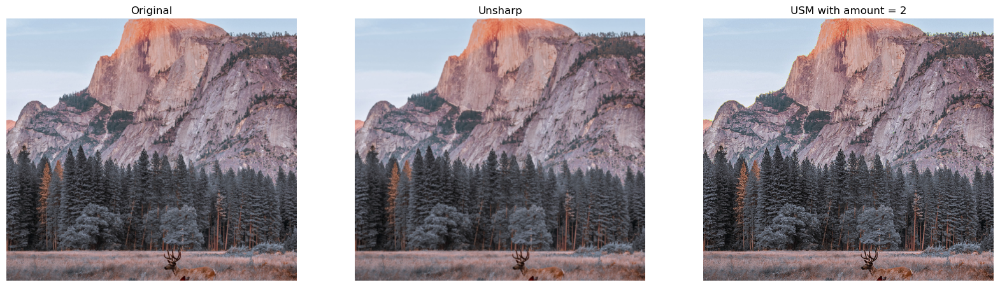

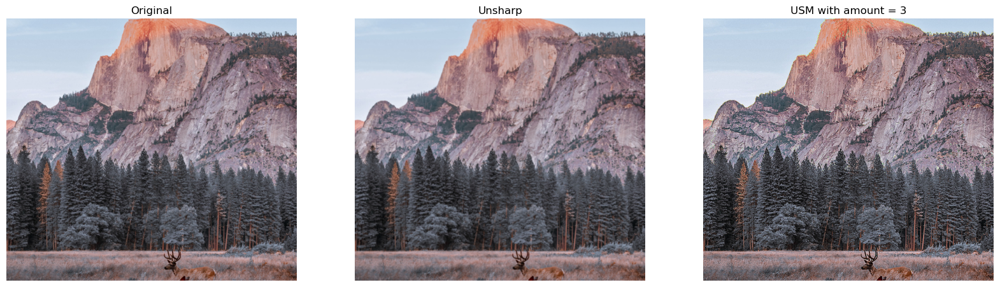

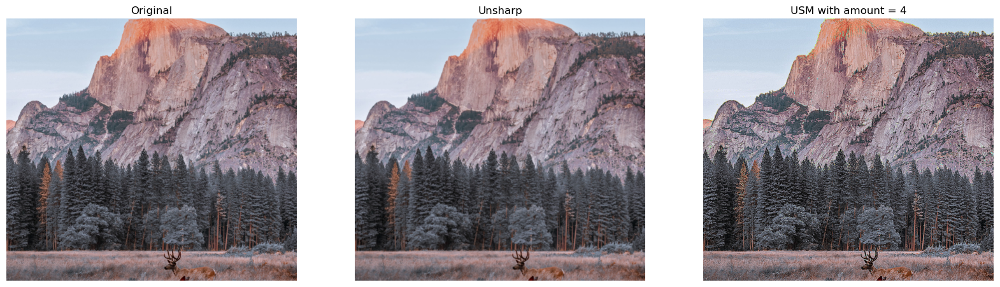

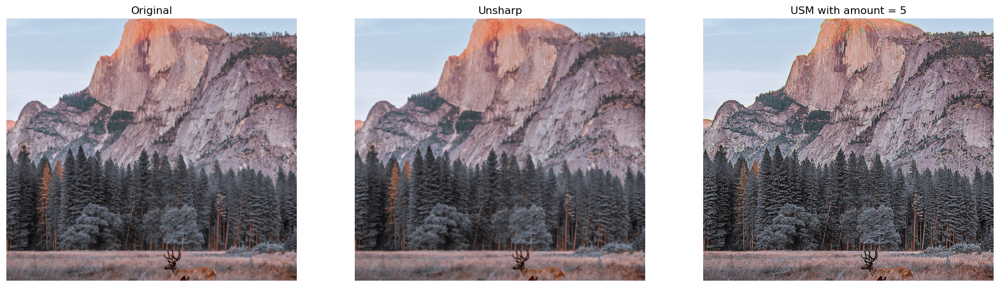

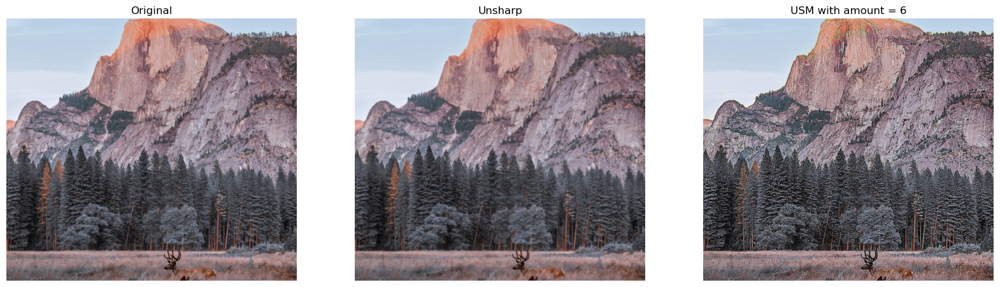

In [ ]:
# Apply USM to get the resulting image using `sharpened = original + (original − unsharp) × amount`
# Note: Again, take care of underflows/overflows if necessary.

for amount in range(1,11):
    sharpened = img.astype(np.float32) + np.multiply(amount, diff) 
   
    sharpened = np.where(sharpened<=0,0, sharpened).astype(np.uint8)
    sharpened = np.where(sharpened>255.0,255, sharpened).astype(np.uint8)
    plt.figure(figsize=(20, 15))
    
    plt.subplot(1,3,1).set_title('Original'); plt.axis('off') 
    plt.imshow(img)
    
    plt.subplot(1,3,2).set_title('Unsharp'); plt.axis('off') 
    plt.imshow(unsharp)
    
    plt.subplot(1,3,3).set_title("USM with amount = " + str(amount)); plt.axis('off')
    plt.imshow(sharpened)

### Questions
* What is a good (reasonable) value for the `amount` parameter?
        Лучший результат в диапазоне 2-4 в общем диапазоне 1-10
 * What happens if it is too small? 
        При малом значении amount - почти не отличатся от оригинала
 * What happens if it is too large?
         При большом значении amount - теряет данные уходя за диапазон и увеличивает шум